### preliminary exploration

In [11]:
#library and seed
library(tidyverse)
library(tidymodels)
library(repr)
library(GGally)
set.seed(1234569)

Warning message:
“package ‘GGally’ was built under R version 4.3.2”
Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



In [6]:
#read data set
# url <- "..."
# credit_csv <- read_csv(url)
credit_csv <- read_csv("data/credit_score.csv")
head(credit_csv)

Rows: 1000 Columns: 87
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (2): CUST_ID, CAT_GAMBLING
dbl (85): INCOME, SAVINGS, DEBT, R_SAVINGS_INCOME, R_DEBT_INCOME, R_DEBT_SAV...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


CUST_ID,INCOME,SAVINGS,DEBT,R_SAVINGS_INCOME,R_DEBT_INCOME,R_DEBT_SAVINGS,T_CLOTHING_12,T_CLOTHING_6,R_CLOTHING,⋯,R_EXPENDITURE_SAVINGS,R_EXPENDITURE_DEBT,CAT_GAMBLING,CAT_DEBT,CAT_CREDIT_CARD,CAT_MORTGAGE,CAT_SAVINGS_ACCOUNT,CAT_DEPENDENTS,CREDIT_SCORE,DEFAULT
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
C02COQEVYU,33269,0,532304,0.0000,16.0000,1.2000,1889,945,0.5003,⋯,0.0000,0.0625,High,1,0,0,0,0,444,1
C02OZKC0ZF,77158,91187,315648,1.1818,4.0909,3.4615,5818,111,0.0191,⋯,0.7692,0.2222,No,1,0,0,1,0,625,0
C03FHP2D0A,30917,21642,534864,0.7000,17.3000,24.7142,1157,860,0.7433,⋯,1.4286,0.0578,High,1,0,0,1,0,469,1
C03PVPPHOY,80657,64526,629125,0.8000,7.8000,9.7499,6857,3686,0.5376,⋯,1.2500,0.1282,High,1,0,0,1,0,559,0
C04J69MUX0,149971,1172498,2399531,7.8182,16.0000,2.0465,1978,322,0.1628,⋯,0.1163,0.0568,High,1,1,1,1,1,473,0
C04Q46QKOG,181636,339055,1695274,1.8667,9.3334,5.0000,11446,1910,0.1669,⋯,0.3571,0.0714,No,1,0,0,1,0,596,0


#### explanation of variables
1. CREDIT_SCORE: Numerical target variable representing the customer's credit score (integer)
2. INCOME: Total income in the last 12 months
3. SAVINGS: Total savings in the last 12 months
4. DEBT: Total existing debt
5. R_SAVINGS_INCOME: Ratio of savings to income
6. R_DEBT_INCOME: Ratio of debt to income
7. R_DEBT_SAVINGS: Ratio of debt to savings
8. T_HOUSING_12: Total expenditure in housing in the last 12 months

reference: https://www.kaggle.com/datasets/conorsully1/credit-score?resource=download

In [9]:
#select 8 columns
credit_data <- select(credit_csv, INCOME:R_DEBT_SAVINGS, T_HOUSING_12, CREDIT_SCORE)
head(credit_data)

INCOME,SAVINGS,DEBT,R_SAVINGS_INCOME,R_DEBT_INCOME,R_DEBT_SAVINGS,T_HOUSING_12,CREDIT_SCORE
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
33269,0,532304,0.0000,16.0000,1.2000,3006,444
77158,91187,315648,1.1818,4.0909,3.4615,16339,625
30917,21642,534864,0.7000,17.3000,24.7142,2759,469
80657,64526,629125,0.8000,7.8000,9.7499,12619,559
149971,1172498,2399531,7.8182,16.0000,2.0465,42658,473
181636,339055,1695274,1.8667,9.3334,5.0000,30650,596


Using `ggpairs` to explore relationships between variabls

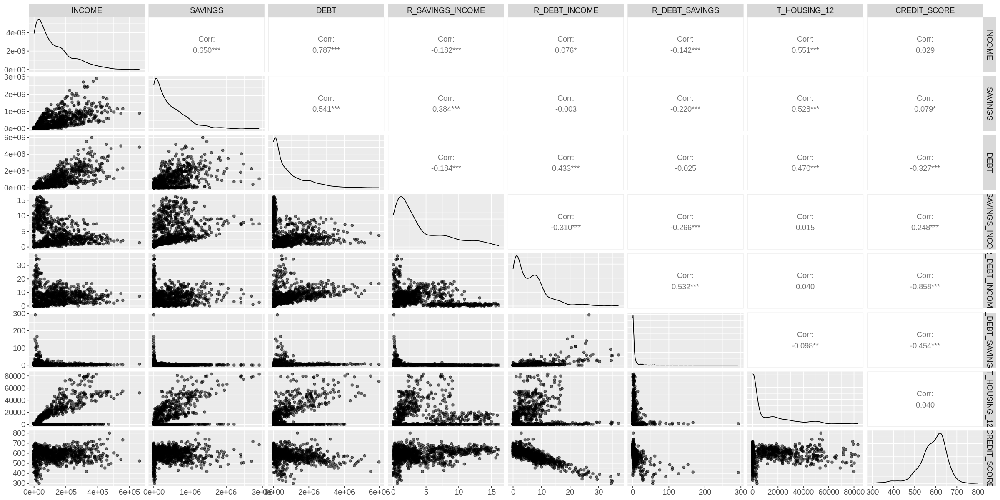

In [13]:
#explore relationships
options(repr.plot.width = 20, repr.plot.height = 10)
credit_pairs <- credit_data |>
    ggpairs(aes(alpha = 0.05)) +
    theme(text = element_text(size = 14))
credit_pairs

#### discoveries
Only `R_DEBT_INCOME` has obviious negative relationship (Corr -0.858) with `CREDIT_SCORE`. This means that the absolute value may not influence the credit score but the ratio does. The Next Steps should try to explore more ratio variables.

##### create a new tibble, credit_ratio
##### repeat the same steps with ratio variables
##### determine the several most relatione

try: 
R_[GROUP]INCOME: Ratio of T[GROUP]_12 to INCOME
R_[GROUP]SAVINGS: Ratio of T[GROUP]_12 to SAVINGS
R_[GROUP]DEBT: Ratio of T[GROUP]_12 to DEBT

[GROUP] can be housing, clothing, etc.

reference: https://www.kaggle.com/datasets/conorsully1/credit-score?resource=download
column names: see the csv file